# Importing libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import networkx as nx
from networkx import closeness_centrality, degree_centrality
from networkx.algorithms.community import girvan_newman

import community as community_louvain

# Create Final Dataset

In [2]:
# Load the authors relations DataFrame from a CSV file
relations_df = pd.read_csv('data/authors_relations.csv')

# Drop the first column if it is an unnamed index column
relations_df.drop(columns=relations_df.columns[0], inplace=True)

# Load the sentiment analysis results DataFrame from a CSV file
scores_df = pd.read_csv('sentiment_analysis_results_2024-05-29.csv')

scores_df.head()

/tmp/ipykernel_12281/2048496280.py:3: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,2

In [4]:
# Create a dictionary with column names as keys and lists of non-null values from each column
column_lists = {col: scores_df[col].dropna().tolist() for col in scores_df.columns}

# Filter the lists to only include values that start with '<output>'
filtered_column_lists = {col: [val for val in values if str(val).startswith('<output>')] for col, values in column_lists.items()}

# Create a new DataFrame with 'Parent_Author' and 'opinion'
df = pd.DataFrame([(key, value) for key, values in filtered_column_lists.items() for value in values],
                         columns=['Parent_Author', 'Opinion'])

In [6]:
# Display unique values in the 'Opinion' column before replacement
print(df['Opinion'].unique())

# Replace opinion strings with numerical values
df['Opinion'].replace('<output>Drake Positive</output>', -1, inplace=True)
df['Opinion'].replace('<output>Kendrick Lamar Positive</output>', 1, inplace=True)
df['Opinion'].replace('<output>Drake Negative</output>', 1, inplace=True)
df['Opinion'].replace('<output>Neutral</output>', 0, inplace=True)

# Display unique values in the 'Opinion' column after replacement
print(df['Opinion'].unique())

array(['<output>Drake Positive</output>',
       '<output>Kendrick Lamar Positive</output>',
       '<output>Neutral</output>', '<output>Drake Negative</output>'],
      dtype=object)

In [9]:
# Group by 'Parent_Author' and calculate the mean 'Opinion' for each author
df = df.groupby('Parent_Author')['Opinion'].mean().reset_index()

# Display the first few rows of the DataFrame to ensure the grouping and mean calculation is correct
print(df.head())

# Merge the relations_df with df on the 'Parent_Author' column
# Use an outer join to include all parent authors from both DataFrames
final_df = pd.merge(relations_df, df, on='Parent_Author', how='outer')

# Drop any rows with NaN values resulting from the merge
final_df.dropna(inplace=True)

# Display the first few rows of the merged DataFrame to ensure correctness
print(final_df.head())

final_df = pd.DataFrame(final_df)

# Graph construction

In [16]:
# Create an empty graph
G = nx.Graph()

# Define the length of the dataset to be used
dataset_len = 8000

# Add nodes and edges to the graph
for index, row in final_df[:dataset_len].iterrows():
    # Add the parent author as a node with their opinion score as an attribute
    G.add_node(row['Parent_Author'], opinion=row['Opinion'])
    
    # Add the reply author as a node with their opinion score as an attribute
    G.add_node(row['Reply_Author'], opinion=row['Opinion'])
    
    # Add an edge between the parent author and the reply author
    G.add_edge(row['Parent_Author'], row['Reply_Author'])

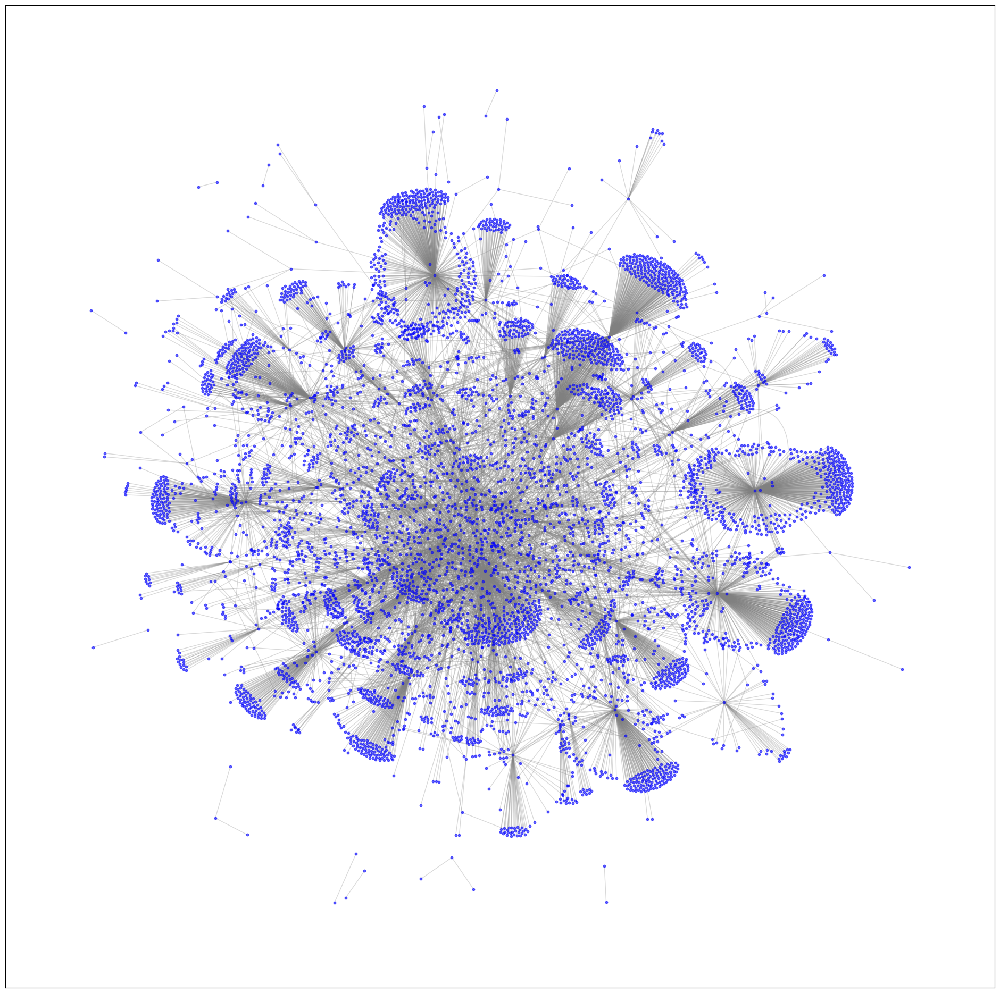

In [17]:
# Plotting the graph
plt.figure(figsize=(24, 24))  # Set the figure size for the plot

# Generate positions for each node in the graph using the spring layout algorithm
pos = nx.spring_layout(G, k=0.05)

# Draw the nodes of the graph
nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.6)

# Draw the edges of the graph
nx.draw_networkx_edges(G, pos, alpha=0.3, edge_color='gray')

# Display the plot
plt.show()

## Graph exploration

In [18]:
# Number of edges in the graph
num_edges = G.number_of_edges()
print(f"Number of edges: {num_edges}")

# Number of nodes in the graph
num_nodes = G.number_of_nodes()
print(f"Number of nodes: {num_nodes}")

# Average clustering coefficient
avg_clustering = nx.average_clustering(G)
print(f"Average clustering coefficient: {avg_clustering}")

# Global clustering coefficient (transitivity)
global_clustering = nx.transitivity(G)
print(f"Global clustering coefficient (transitivity): {global_clustering}")

# Closeness centrality for each node
closeness_centrality = nx.closeness_centrality(G)

# Print closeness centrality for the first few nodes to avoid clutter
for node, centrality in list(closeness_centrality.items())[:10]:
    print(f"Closeness centrality for node {node}: {centrality}")

7836

## Most relevant users

In [23]:
# Define a function to print the top n elements in a dictionary based on their values
def print_top_n_elements(d, n=10):
    # Sort the dictionary by its values in descending order and slice the top n elements
    top_n = dict(sorted(d.items(), key=lambda item: item[1], reverse=True)[:n])
    return top_n

# top 100 most relevant users
print_top_n_elements(degree_centrality(G), 100)

{'AutoModerator': 0.0752858958068615,
 'ICumCoffee': 0.06782083862770014,
 'arealdisneyprincess': 0.06035578144853876,
 'boxed_knives': 0.05717916137229988,
 'monstercat129': 0.03954891994917408,
 'Solid_Illustrator640': 0.03796060991105464,
 'UltraAirWolf': 0.03462515883100381,
 'MK121895': 0.03033672172808132,
 'Zealousideal_Bet_248': 0.024142312579415504,
 'The_MadStork': 0.023824650571791613,
 'lexE5839': 0.023506988564167726,
 'anxietystrings': 0.021601016518424398,
 'braww': 0.02096569250317662,
 'mayonnaiser_13': 0.01890088945362135,
 'Me_Zebra': 0.01826556543837357,
 'MxCxVA': 0.013818297331639137,
 'flecqued': 0.013818297331639137,
 'droppinturds': 0.013500635324015249,
 'bynobodyspecial': 0.012706480304955529,
 'PUNlSHEDVENOMSNAKE': 0.012547649301143583,
 'BlackBalor': 0.011753494282083863,
 'Hulumoto': 0.01159466327827192,
 'Big-Sheepherder-9492': 0.011435832274459976,
 'justiceway1': 0.011118170266836086,
 'PandaTheCoolWasTaken': 0.01048284625158831,
 'mooimafish33': 0.0104

Plotting the most relevant users on the graph using degree centrality

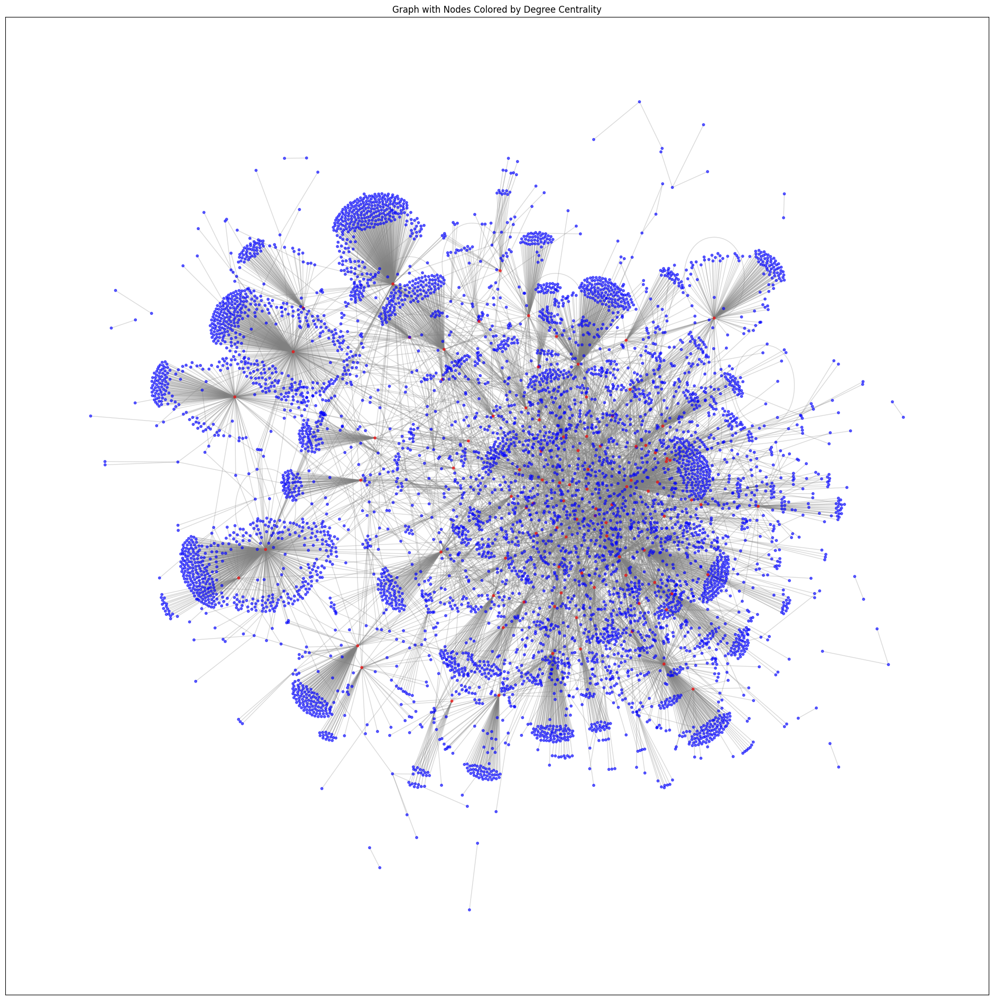

In [24]:
# Initialize an empty list to store node colors
node_colors = []

# Determine the threshold for the top 100 nodes with the highest degree centrality
threshold = min(list(print_top_n_elements(degree_centrality(G), 100).values()))

# Iterate through all nodes in the graph
for node in G.nodes():
    # Check if the node's degree centrality is above the threshold
    if degree_centrality(G)[node] > threshold:
        node_colors.append('red')  # Assign red color for high degree centrality
    else:
        node_colors.append('blue')  # Assign blue color for low degree centrality

# Set up the figure for plotting with specified dimensions
plt.figure(figsize=(24, 24))

# Generate positions for each node in the graph using the spring layout algorithm
pos = nx.spring_layout(G, k=0.05)

# Draw the nodes of the graph with specified colors and sizes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=10, alpha=0.6)

# Draw the edges of the graph
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

# Set the title of the graph
plt.title("Graph with Nodes Colored by Degree Centrality")

# Display the graph
plt.show()

Plotting top 100 users with the highest betweenes centrality

In [25]:
# Calculate betweenness centrality for the graph
betweenness_centrality_values = nx.betweenness_centrality(G)

# Get the top 100 nodes based on betweenness centrality
top_100_betweenness = print_top_n_elements(betweenness_centrality_values, 100)

# Print the top 100 nodes with the highest betweenness centrality
print(top_100_betweenness)

{'AutoModerator': 0.4684646404303105,
 'Solid_Illustrator640': 0.1845183360382869,
 'boxed_knives': 0.1715059712013342,
 'ICumCoffee': 0.14249230121092937,
 'arealdisneyprincess': 0.13215198077928003,
 'monstercat129': 0.06940805807850702,
 'UltraAirWolf': 0.06618178305882758,
 'MK121895': 0.06428666700095764,
 'The_MadStork': 0.0604047800258165,
 'Zealousideal_Bet_248': 0.0518354734929845,
 'lexE5839': 0.0517130403704496,
 'mayonnaiser_13': 0.045577278041019416,
 'anxietystrings': 0.03936595160025235,
 'Me_Zebra': 0.037359666255329486,
 'braww': 0.036462933872797934,
 'PUNlSHEDVENOMSNAKE': 0.033061888682200904,
 'RANDOM-902': 0.027435115927060383,
 'flecqued': 0.02491587128902397,
 'MxCxVA': 0.02480991879100255,
 'mickysD': 0.02434785926825162,
 'droppinturds': 0.023438660480015108,
 'bynobodyspecial': 0.0217465613448421,
 'Big-Sheepherder-9492': 0.021419968869498658,
 'the_scrambler': 0.021294996811740755,
 'BlackBalor': 0.021110598469452443,
 'HolyNinjaCow': 0.020825250894341132,
 '

Community detectioin using sentiment analysis

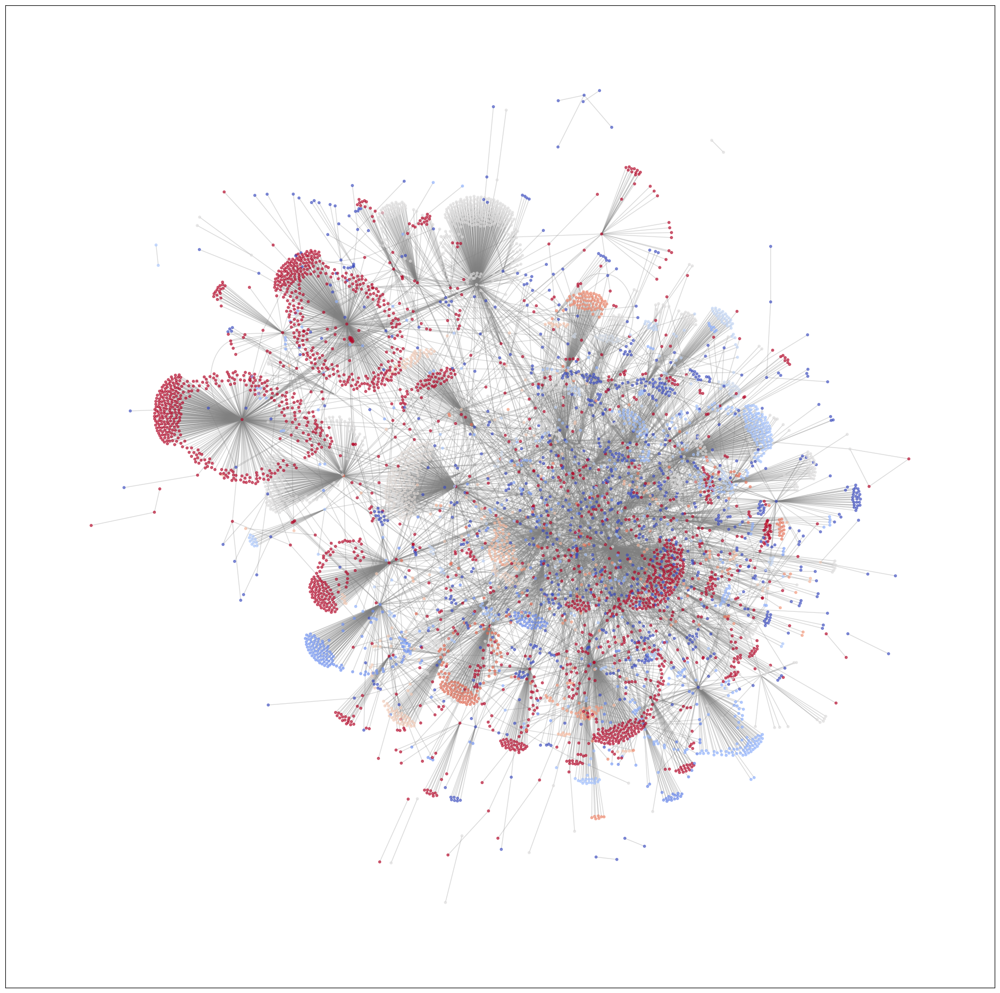

In [26]:
# Get the opinion scores for coloring
opinion_scores = [G.nodes[node]['opinion'] for node in G.nodes()]

# Create a color map
norm = mcolors.Normalize(vmin=-1, vmax=1)  # Normalize the opinion scores between -1 and 1
cmap = plt.cm.coolwarm  # Use the coolwarm color map

# Apply the color map to the opinion scores
node_colors = [cmap(norm(score)) for score in opinion_scores]

# Set up the figure for plotting with specified dimensions
plt.figure(figsize=(24, 24))

# Generate positions for each node in the graph using the spring layout algorithm
pos = nx.spring_layout(G, k=0.05)

# Draw the nodes of the graph with the specified colors and sizes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=10, alpha=0.6)

# Draw the edges of the graph
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

# Display the graph
plt.show()

In [27]:
#finding who won according to popular opinion for this part of the dataset

# Initialize counters for opinions
kendrick = 0
drake = 0
neutral = 0

for i in range(dataset_len):
    if final_df["Opinion"].iloc[i] > 0.1:
        kendrick += 1
    elif final_df["Opinion"].iloc[i] < -0.1:
        drake += 1
    else:
        neutral += 1

# Print the results
print(f"People in favor of Kendrick Lamar: {kendrick}")
print(f"People in favor of Drake: {drake}")
print(f"People who are neutral: {neutral}")

People who think Kendrick Lamar won: 3497
People who think Drake won: 2684
People who are neutral: 1819


# Community detection algorithms

Label propagation algorithm

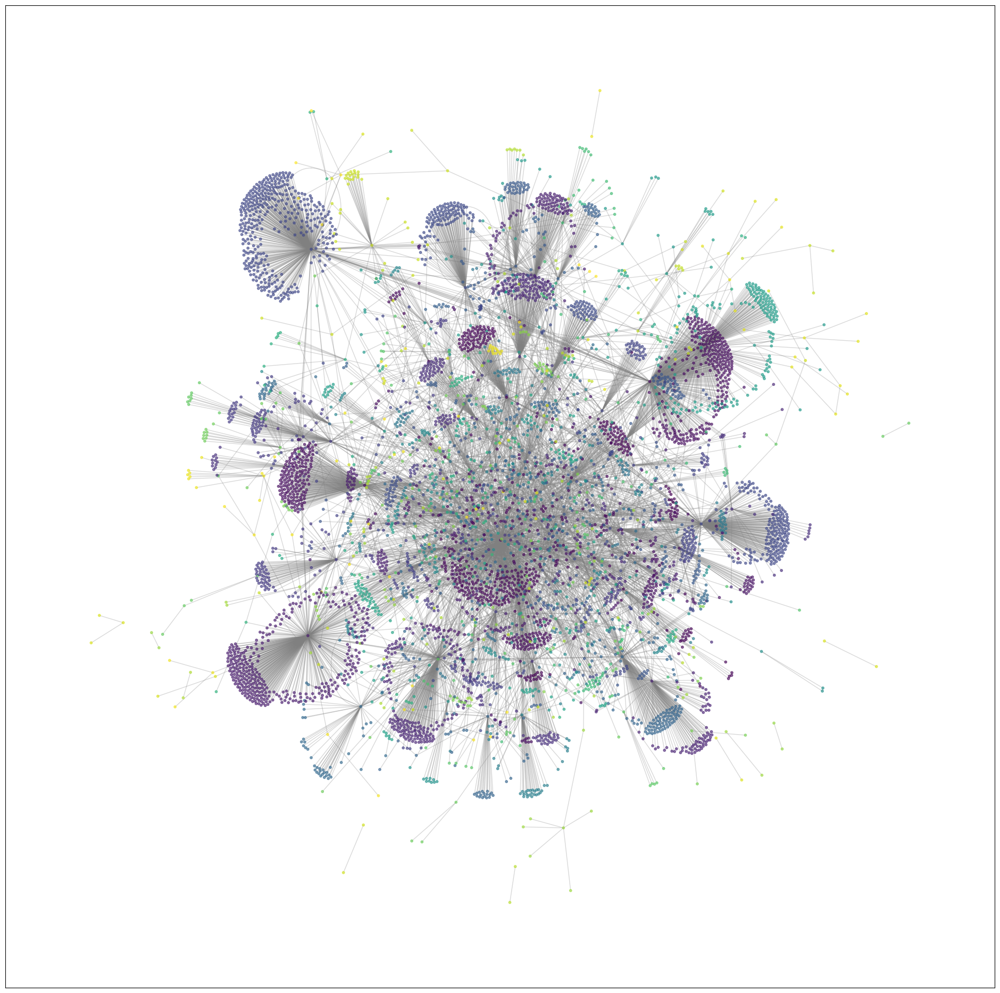

In [29]:
# Apply the Label Propagation Algorithm
communities = nx.algorithms.community.label_propagation.label_propagation_communities(G)

# Convert the communities to a list of sets
communities = list(communities)

# Assign a community to each node
node_community = {}
for i, community in enumerate(communities):
    for node in community:
        node_community[node] = i

# Get the color for each node
colors = [node_community[node] for node in G.nodes()]

# Draw the graph with node colors representing communities
plt.figure(figsize=(24, 24))
pos = nx.spring_layout(G, k=0.05)
nx.draw_networkx_nodes(G, pos, node_color=colors, node_size=10, alpha=0.6)
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

plt.show()

louvian method

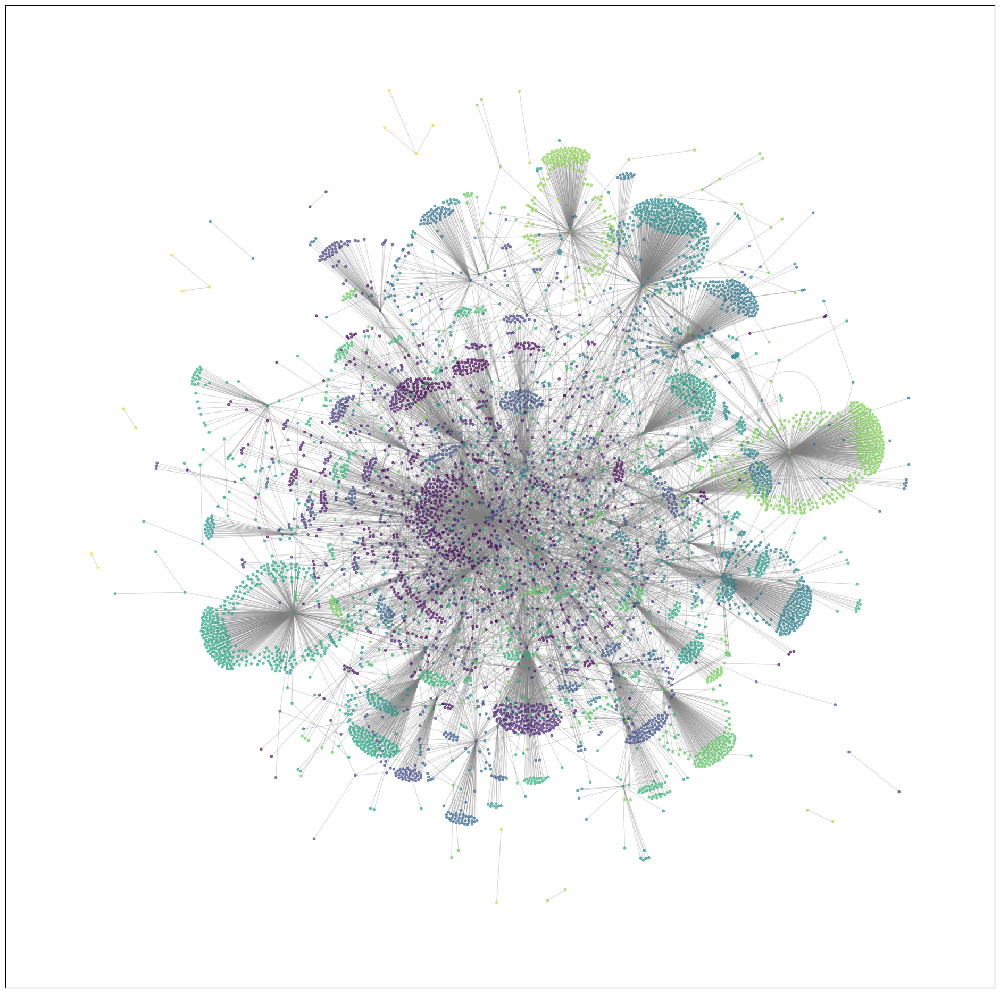

In [31]:
# Compute the best partition using the Louvain method
partition = community_louvain.best_partition(G)

# Get the community color for each node
colors = [partition[node] for node in G.nodes()]

# Draw the graph with node colors representing communities
plt.figure(figsize=(24, 24))  # Set the figure size for the plot
pos = nx.spring_layout(G, k=0.05)  # Generate positions for each node in the graph using the spring layout algorithm

# Draw the nodes with colors representing their community
nx.draw_networkx_nodes(G, pos, node_color=colors, node_size=10, alpha=0.6)

# Draw the edges of the graph
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

# Display the graph
plt.show()

Grievan-newman

In [32]:
# Apply the Girvan-Newman Algorithm to detect communities
comp = girvan_newman(G)

# Get the first level of communities detected by the algorithm
limited = tuple(sorted(c) for c in next(comp))

# Assign a community index to each node
node_community = {}
for i, community in enumerate(limited):
    for node in community:
        node_community[node] = i

# Get the color for each node based on its community index
colors = [node_community[node] for node in G.nodes()]

# Set up the figure for plotting with specified dimensions
plt.figure(figsize=(24, 24))

# Generate positions for each node in the graph using the spring layout algorithm
pos = nx.spring_layout(G, k=0.05)

# Draw the nodes of the graph with specified colors and sizes
nx.draw_networkx_nodes(G, pos, node_color=colors, node_size=10, alpha=0.6)

# Draw the edges of the graph
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

# Set the title of the graph
plt.title("Graph with Nodes Colored by Communities (Girvan-Newman)")

# Display the graph
plt.show()